In [1]:
import turicreate as tc

In [2]:
image_folder = 'image'

In [3]:
data = tc.image_analysis.load_images(image_folder, with_path=True)

In [11]:
data

path,image,label
image/cat/IMG_3654(20190328-103427).jpg ...,Height: 3024 Width: 4032,yyx
image/cat/IMG_3659.JPG,Height: 3024 Width: 4032,yyx
image/cat/IMG_3674(20190328-103425).jpg ...,Height: 4032 Width: 3024,yyx
image/cat/IMG_3691.JPG,Height: 3024 Width: 4032,yyx
image/cat/IMG_3749(20190328-103427).jpg ...,Height: 4032 Width: 3024,yyx
image/cat/IMG_3809.JPG,Height: 1280 Width: 720,yyx
image/cat/IMG_3913.JPG,Height: 1080 Width: 1920,yyx
image/cat/IMG_4069.JPG,Height: 769 Width: 768,yyx
image/cat/IMG_4177.JPG,Height: 3024 Width: 4032,yyx
image/cat/IMG_4225.JPG,Height: 1280 Width: 960,yyx


In [13]:
data['label'] = data['path'].apply(lambda path: 'cat' if 'cat' in path else 'fish' if 'fish' in path else 'sunflower' if 'sunflower' in path else 'wo' )

In [14]:
data

path,image,label
image/cat/IMG_3654(20190328-103427).jpg ...,Height: 3024 Width: 4032,cat
image/cat/IMG_3659.JPG,Height: 3024 Width: 4032,cat
image/cat/IMG_3674(20190328-103425).jpg ...,Height: 4032 Width: 3024,cat
image/cat/IMG_3691.JPG,Height: 3024 Width: 4032,cat
image/cat/IMG_3749(20190328-103427).jpg ...,Height: 4032 Width: 3024,cat
image/cat/IMG_3809.JPG,Height: 1280 Width: 720,cat
image/cat/IMG_3913.JPG,Height: 1080 Width: 1920,cat
image/cat/IMG_4069.JPG,Height: 769 Width: 768,cat
image/cat/IMG_4177.JPG,Height: 3024 Width: 4032,cat
image/cat/IMG_4225.JPG,Height: 1280 Width: 960,cat


In [15]:
data.save('cat-wo.sframe')

In [16]:
data.explore()

Materializing SFrame

In [17]:
train_data, test_data = data.random_split(0.8, seed=2)

In [18]:
model = tc.image_classifier.create(train_data, target='label')

Download completed: /var/folders/pm/q1w6jqks6sd_560ld5x_8_5r0000gn/T/model_cache/resnet-50-symbol.json
Download completed: /var/folders/pm/q1w6jqks6sd_560ld5x_8_5r0000gn/T/model_cache/resnet-50-0000.params


Analyzing and extracting image features.

+------------------+--------------+------------------+

| Images Processed | Elapsed Time | Percent Complete |

+------------------+--------------+------------------+

| 58               | 15.78s       | 100%             |

+------------------+--------------+------------------+

Logistic regression:

--------------------------------------------------------

Number of examples          : 58

Number of classes           : 4

Number of feature columns   : 1

Number of unpacked features : 2048

Number of coefficients      : 6147

Starting L-BFGS

--------------------------------------------------------

+-----------+----------+-----------+--------------+-------------------+

| Iteration | Passes   | Step size | Elapsed Time | Training Accuracy |

+-----------+----------+-----------+--------------+-------------------+

| 0         | 2        | 1.000000  | 0.063203     | 0.931034          |

| 1         | 4        | 1.000000  | 0.145456     | 1.000000          |

| 2         | 7        | 0.479410  | 0.217176     | 1.000000          |

| 3         | 9        | 0.479410  | 0.272534     | 1.000000          |

| 4         | 11       | 0.479410  | 0.328293     | 1.000000          |

| 8         | 18       | 0.479410  | 0.518871     | 1.000000          |

+-----------+----------+-----------+--------------+-------------------+

In [19]:
predictions = model.predict(test_data)

In [20]:
metrics = model.evaluate(test_data)print(metrics['accuracy'])

SyntaxError: invalid syntax (<ipython-input-20-9421342304cc>, line 1)

In [21]:
model = tc.image_similarity.create(data)

Analyzing and extracting image features.

+------------------+--------------+------------------+

| Images Processed | Elapsed Time | Percent Complete |

+------------------+--------------+------------------+

| 64               | 1.86s        | 50%              |

| 69               | 18.84s       | 100%             |

+------------------+--------------+------------------+

Starting brute force nearest neighbors model training.

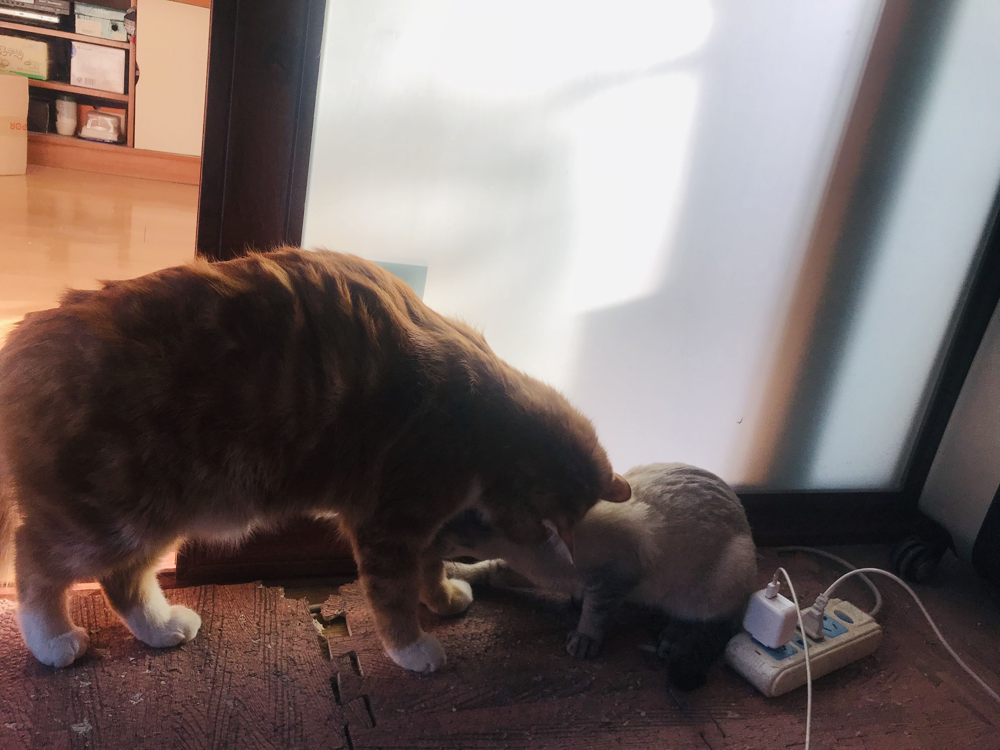

In [22]:
tc.Image(data[0]['path']).show()

In [23]:
similar_images = model.query(data[0:1], k=10)

Analyzing and extracting image features.

+------------------+--------------+------------------+

| Images Processed | Elapsed Time | Percent Complete |

+------------------+--------------+------------------+

| 1                | 774.217ms    | 100%             |

+------------------+--------------+------------------+

Starting pairwise querying.

+--------------+---------+-------------+--------------+

| Query points | # Pairs | % Complete. | Elapsed Time |

+--------------+---------+-------------+--------------+

| 0            | 2       | 2.89855     | 10.312ms     |

| Done         |         | 100         | 13.006ms     |

+--------------+---------+-------------+--------------+

In [24]:
similar_images

query_label,reference_label,distance,rank
0,0,0.0,1
0,10,19.9961906477,2
0,3,20.1276193564,3
0,12,20.370714529,4
0,11,20.715617938,5
0,13,21.8163620968,6
0,7,22.0953556275,7
0,1,22.3593096088,8
0,2,22.605183187,9
0,16,22.6483122087,10


In [25]:
similar_image_index = similar_images['reference_label'][1:]

In [26]:
similar_image_index

dtype: int
Rows: 9
[10, 3, 12, 11, 13, 7, 1, 2, 16]

In [27]:
filtered_index = data['id'].apply(lambda x : x in similar_image_index)

RuntimeError: Column name id does not exist.

In [28]:
filtered_index

NameError: name 'filtered_index' is not defined

In [29]:
filtered_index = data[].apply(lambda x : x in similar_image_index)

SyntaxError: invalid syntax (<ipython-input-29-db340e2601c7>, line 1)

In [30]:
metrics = model.evaluate(test_data)
print(metrics['accuracy'])

AttributeError: 'ImageSimilarityModel' object has no attribute 'evaluate'

In [31]:
train_data, test_data = data.random_split(0.8, seed=2)

In [32]:
model = tc.image_classifier.create(train_data, target='label')

Analyzing and extracting image features.

+------------------+--------------+------------------+

| Images Processed | Elapsed Time | Percent Complete |

+------------------+--------------+------------------+

| 58               | 17.38s       | 100%             |

+------------------+--------------+------------------+

Logistic regression:

--------------------------------------------------------

Number of examples          : 58

Number of classes           : 4

Number of feature columns   : 1

Number of unpacked features : 2048

Number of coefficients      : 6147

Starting L-BFGS

--------------------------------------------------------

+-----------+----------+-----------+--------------+-------------------+

| Iteration | Passes   | Step size | Elapsed Time | Training Accuracy |

+-----------+----------+-----------+--------------+-------------------+

| 0         | 2        | 1.000000  | 0.052841     | 0.931034          |

| 1         | 4        | 1.000000  | 0.149847     | 1.000000          |

| 2         | 7        | 0.479410  | 0.228029     | 1.000000          |

| 3         | 9        | 0.479410  | 0.284859     | 1.000000          |

| 4         | 11       | 0.479410  | 0.339270     | 1.000000          |

| 8         | 18       | 0.479410  | 0.532795     | 1.000000          |

+-----------+----------+-----------+--------------+-------------------+

In [33]:
predictions = model.predict(test_data)

In [34]:
metrics = model.evaluate(test_data)
print(metrics['accuracy'])

Analyzing and extracting image features.

+------------------+--------------+------------------+

| Images Processed | Elapsed Time | Percent Complete |

+------------------+--------------+------------------+

| 11               | 2.72s        | 100%             |

+------------------+--------------+------------------+

0.909090909091


In [35]:
predictions

dtype: str
Rows: 11
['cat', 'cat', 'fish', 'fish', 'fish', 'fish', 'fish', 'sunflower', 'cat', 'wo', 'wo']

In [36]:
test_data['label']

dtype: str
Rows: 11
['cat', 'cat', 'fish', 'fish', 'fish', 'fish', 'fish', 'sunflower', 'sunflower', 'wo', 'wo']

In [37]:
test_data[test_data['label'] != predictions]

path,image,label
image/sunflower/bfc7f83361b41fb97536b0c75137d0 ...,Height: 680 Width: 1024,sunflower


In [38]:
wrong_pred_img_path = test_data[predictions != test_data['label']][0]['path']

In [39]:
img.show()

NameError: name 'img' is not defined

In [40]:
img = tc.Image(wrong_pred_img_path)

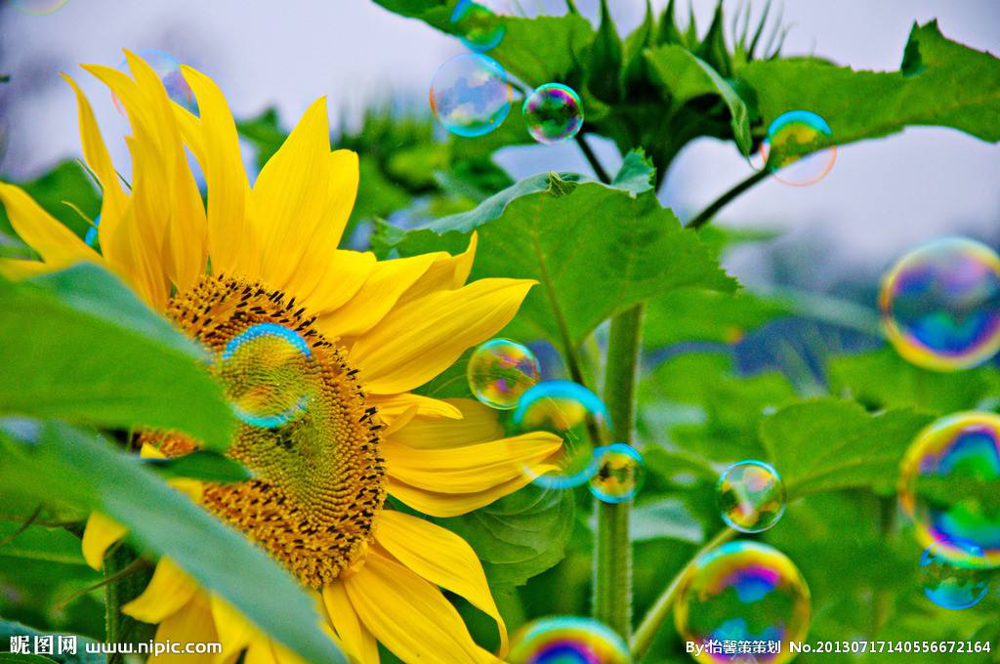

In [41]:
img.show()

In [42]:
model.export_coreml('test1.mlmodel')